# Compare the v4.2 recalibrated SDSS Stripe82 catalog 
# and the CFIS catalog from Stephen Gwyn

[Link to helper tools](#dataTools) 

[Link to data reading](#dataReading) 

[Link to data analysis](#dataAnalysis) 

In [1]:
%matplotlib inline
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.table import hstack
import matplotlib.pyplot as plt 
import numpy as np
from astroML.plotting import hist
# for astroML installation see https://www.astroml.org/user_guide/installation.html

In [2]:
## automatically reload any modules read below that might have changed (e.g. plots)
%load_ext autoreload
%autoreload 2
# importing ZI tools: 
import ZItools as zit
# importing Karun's tools: 
import KTtools as ktt

<a id='dataTools'></a>

### Helper Tools

In [3]:
# robust standard deviation
def sigG(arr):
    return 0.741*(np.quantile(arr, 0.75)-np.quantile(arr, 0.25))

In [4]:
def doOneColor(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, 0.5, 3.1, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    goodC = d[np.abs(d['colorresid'])<0.3]
    
    ### plots 
    # RA
    print(' stats for RA binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_RA.png'
    Ylabel =kw['Ystr'] + ' residuals'
    kwOC = {"Xstr":'raW', "Xmin":-52, "Xmax":45, "Xlabel":'R.A. (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-51.5, "XmaxBin":45, "nBin":56, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    # Dec
    print('-----------')
    print(' stats for Dec binning medians:')
    plotName = plotNameRoot + '_Dec.png'
    kwOC = {"Xstr":'dec', "Xmin":-0.5, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-0.45, "XmaxBin":1.26, "nBin":52, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    Ylabel = 'residuals for ($u_{SDSS}$ - $u_{CFIS}$)'
    kwOC = {"Xstr":'dec', "Xmin":-0.5, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-0.45, "XmaxBin":1.26, "nBin":52, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":0.05}
    color = 'colorresid' 
    kwOC["Ystr"] = color 
    kwOC["plotName"] = 'colorResidCFISug_Dec_Hess.png'  
    kwOC["nBinX"] = 55
    kwOC["nBinY"] = 25
    kwOC["cmap"] = 'plasma'
    ktt.plotdelMagBW_KT(sdssCFISug, kwOC)
    
    
    print('made plot', plotName)
    # r SDSS
    print('-----------')
    print(' stats for SDSS u binning medians:')
    plotName = plotNameRoot + '_umag.png'    
    kwOC = {"Xstr":'u_mMed', "Xmin":15.2, "Xmax":22.5, "Xlabel":'SDSS u (mag)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":16, "XmaxBin":22, "nBin":55, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    print('------------------------------------------------------------------')

def doOneColorRA(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, 0.5, 3.1, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    goodC = d[np.abs(d['colorresid'])<0.3]
    
    ### plots 
    # RA
    print(' stats for RA binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_RA.png'
    Ylabel = 'u band residuals (SDSS vs. CFIS, BP-RP)'
    kwOC = {"Xstr":'raW', "Xmin":-52, "Xmax":62, "Xlabel":'R.A. (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-48, "XmaxBin":45, "nBin":56, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    plotdelMag2(goodC, kwOC, True)
    print('made plot', plotName)   

    
def doOneColorDec(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, 0.5, 3.1, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    goodC = d[np.abs(d['colorresid'])<0.3]
    
    ### plots 
    # Dec
    print('-----------')
    print(' stats for Dec binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_Dec.png'
    Ylabel = 'u band residuals (SDSS vs. CFIS, BP-RP)'
    kwOC = {"Xstr":'dec', "Xmin":-1.3, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-0.45, "XmaxBin":1.26, "nBin":35, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    plotdelMag2(goodC, kwOC, False)
    print('made plot', plotName)
 



In [5]:
## a horrible hack to compare CFIS and Gaia results for the u band
def plotdelMag2(d, kw, RA=True):
 
    print('medianAll:', np.median(d[kw['Ystr']]), 'std.dev.All:', sigG(d[kw['Ystr']]))
    print('N=', np.size(d[kw['Ystr']]), 'min=', np.min(d[kw['Ystr']]), 'max=', np.max(d[kw['Ystr']]))

    fig, ax = plt.subplots(figsize=(12, 8))
    ax.scatter(d[kw['Xstr']], d[kw['Ystr']], s=kw['symbSize'], c='black') 
    # binning
    xBinM, nPtsM, medianBinM, sigGbinM = zit.fitMedians(d[kw['Xstr']], \
                                         d[kw['Ystr']], kw['XminBin'], kw['XmaxBin'], kw['nBin'], 1)
    # plotting
    if (kw['offset'] >= 0):
        xL = np.linspace(kw['XminBin'], kw['XmaxBin'])
        ax.plot(xL, 0*xL, '-', c='red', linewidth=3)
        ax.plot(xL, 0*xL+kw['offset'], '--', c='red', linewidth=3)
        ax.plot(xL, 0*xL-kw['offset'], '--', c='red', linewidth=3)
    if (0):
        ax.scatter(xBinM, medianBinM, s=30.0, c='black', alpha=0.8)
        ax.scatter(xBinM, medianBinM, s=15.0, c='yellow', alpha=0.3)
    #
    TwoSigP = medianBinM + kw['Nsigma']*sigGbinM
    TwoSigM = medianBinM - kw['Nsigma']*sigGbinM 
    ax.plot(xBinM, TwoSigP, c='yellow', linewidth=3)
    ax.plot(xBinM, TwoSigM, c='yellow', linewidth=3)
    #
    rmsBin = np.sqrt(nPtsM) / np.sqrt(np.pi/2) * sigGbinM
    rmsP = medianBinM + rmsBin
    rmsM = medianBinM - rmsBin
    ax.plot(xBinM, rmsP, c='cyan', linewidth=3)
    ax.plot(xBinM, rmsM, c='cyan', linewidth=3)
    # 
    if (RA):
       # read back 
        zpRAgrid, zpRA = np.loadtxt('ZPcorrectionsRA_Gaia_uband_v3.2.dat')  
        ax.plot(zpRAgrid, zpRA, c='blue', linewidth=3)
        here = np.interp(xBinM, zpRAgrid, zpRA) - medianBinM 
        print(np.min(here), np.max(here), sigG(here))
    else:
        zpDecgrid, zpDec = np.loadtxt('ZPcorrectionsDec_Gaia_uband_v3.2.dat')   
        ax.plot(zpDecgrid, zpDec, c='blue', linewidth=3)
        here = np.interp(xBinM, zpDecgrid, zpDec) - medianBinM 
        print(np.min(here), np.max(here), sigG(here))



    ax.set_xlabel(kw['Xlabel'], fontsize=22)
    ax.set_ylabel(kw['Ylabel'], fontsize=22)
    ax.set_xlim(kw['Xmin'], kw['Xmax'])
    ax.set_ylim(kw['Ymin'], kw['Ymax'])
    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)
    plt.savefig(kw['plotName'], dpi=600)
    print('saved plot as:', kw['plotName']) 
    
    
    plt.show()
    return

In [6]:
# both new and old files use identical data structure
colnamesSDSS = ['calib_fla', 'ra', 'dec', 'raRMS', 'decRMS', 'nEpochs', 'AR_val', 
                'u_Nobs', 'u_mMed', 'u_mMean', 'u_mErr', 'u_rms_scatt', 'u_chi2',
                'g_Nobs', 'g_mMed', 'g_mMean', 'g_mErr', 'g_rms_scatt', 'g_chi2',
                'r_Nobs', 'r_mMed', 'r_mMean', 'r_mErr', 'r_rms_scatt', 'r_chi2',
                'i_Nobs', 'i_mMed', 'i_mMean', 'i_mErr', 'i_rms_scatt', 'i_chi2',
                'z_Nobs', 'z_mMed', 'z_mMean', 'z_mErr', 'z_rms_scatt', 'z_chi2']

### code for generating new quantities, such as dra, ddec, colors, differences in mags, etc
def derivedColumns(matches):
    matches['dra'] = (matches['ra_sdss']-matches['ra_cfis'])*3600
    matches['ddec'] = (matches['dec_sdss']-matches['dec_cfis'])*3600
    ra = matches['ra_sdss'] 
    matches['raW'] = np.where(ra > 180, ra-360, ra) 
    matches['dupsf'] = matches['u_mMed'] - matches['upsf'] 
    matches['duauto'] = matches['u_mMed'] - matches['uauto'] 
    matches['ug'] = matches['u_mMed'] - matches['g_mMed']
    matches['gr'] = matches['g_mMed'] - matches['r_mMed']
    matches['ri'] = matches['r_mMed'] - matches['i_mMed']
    matches['gi'] = matches['g_mMed'] - matches['i_mMed']
    matches['iz'] = matches['i_mMed'] - matches['z_mMed']
    return

<a id='dataReading'></a>

### Define paths and catalogs 

In [7]:
ZIdataDir = "/Users/ivezic/Work/Science/CalibrationV2/SDSS_SSC/Data"
# original analysis
# SDSScatalog = ZIdataDir + "/" + "stripe82calibStars_v3.2.dat" 
# final analysis
# SDSScatalog = ZIdataDir + "/" + "stripe82calibStars_v3.2_noheader_final.dat"
SDSScatalog = ZIdataDir + "/" + "stripe82calibStars_v4.2.dat"
# CFIS catalog (from Stephen Gwyn)
CFIScatalog = ZIdataDir + "/" + "cfis_stripe82.dat" 
colnamesCFIS = ['ra', 'dec', 'upsf', 'uauto', 'upsfErr', 'uautoErr', 'sg']
cfis = Table.read(CFIScatalog, format='ascii', names=colnamesCFIS) 

In [8]:
sdss = Table.read(SDSScatalog, format='ascii', names=colnamesSDSS)

In [9]:
sdss_coords = SkyCoord(ra = sdss['ra']*u.degree, dec= sdss['dec']*u.degree) 
cfis_coords = SkyCoord(ra = cfis['ra']*u.degree, dec= cfis['dec']*u.degree) 

# this is matching cfis to sdss, so that indices are into sdss catalog
# makes sense in this case since the sdss catalog is bigger than gaia
idx, d2d, d3d = cfis_coords.match_to_catalog_sky(sdss_coords)  

# object separation is an object with units, 
# I add that as a column so that one can 
# select based on separation to the nearest matching object
sdssCFISall = hstack([cfis, sdss[idx]], table_names = ['cfis', 'sdss'])
sdssCFISall['sep_2d_arcsec'] = d2d.arcsec

In [10]:
print(np.min(cfis['ra']), np.max(cfis['ra']))

0.0036244 359.8723208


In [11]:
sdssCFIS = sdssCFISall[sdssCFISall['sep_2d_arcsec']<1.0]
print(np.size(sdssCFISall), np.size(sdssCFIS))

964530 324786


In [12]:
derivedColumns(sdssCFIS)

In [13]:
sdssCFIS['ra'] = sdssCFIS['ra_sdss']
sdssCFIS['dec'] = sdssCFIS['dec_sdss']
sdssCFIS['duCFIS'] = sdssCFIS['upsf'] - sdssCFIS['uauto']

In [14]:
sdssCFISug = sdssCFIS[(sdssCFIS['ug']>1.0)&(sdssCFIS['ug']<2.1)]
sdssCFISbright = sdssCFISug[sdssCFISug['r_mMed']<20]
print(np.size(sdssCFIS), np.size(sdssCFISug), np.size(sdssCFISbright))

324786 183457 151238


=========== WORKING ON: dupsf ===================
 stats for RA binning medians:
medianAll: 0.0010399999999995344 std.dev.All: 0.04488978000000048
N= 178050 min= -0.29999999999999716 max= 0.2999000000000037
median: -0.0037749999999995877 std.dev: 0.015949762641378762
saved plot as: colorResidCFISug_dupsf_RA.png


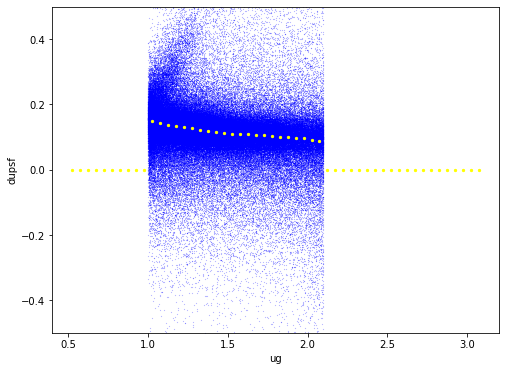

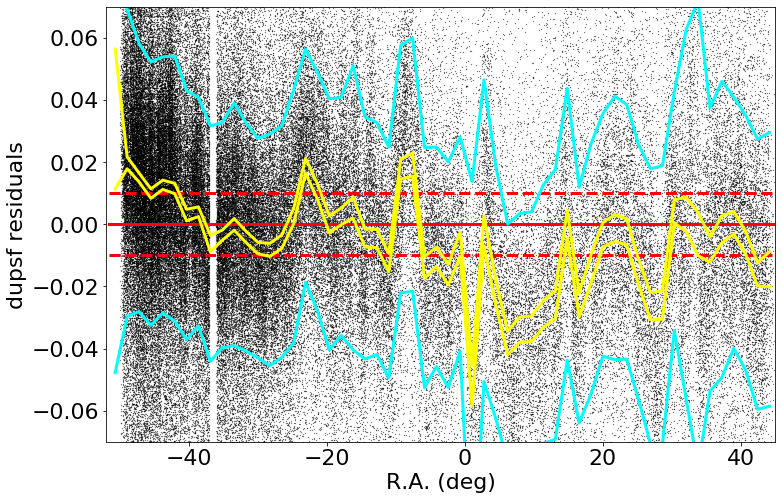

made plot colorResidCFISug_dupsf_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0010399999999995344 std.dev.All: 0.04488978000000048
N= 178050 min= -0.29999999999999716 max= 0.2999000000000037
median: 0.00019999999999836468 std.dev: 0.006113295351716961
saved plot as: colorResidCFISug_dupsf_Dec.png


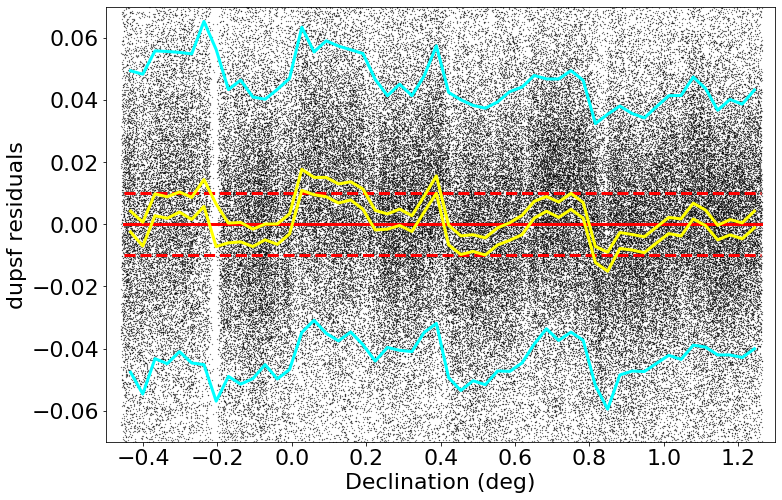

medianAll: 0.001000000000004997 std.dev.All: 0.046890479999998985
N= 183457 min= -4.183720000000003 max= 2.2729299999999997
median: 0.0007200000000034401 std.dev: 0.006427292261768051
saved plot as: colorResidCFISug_Dec_Hess.png


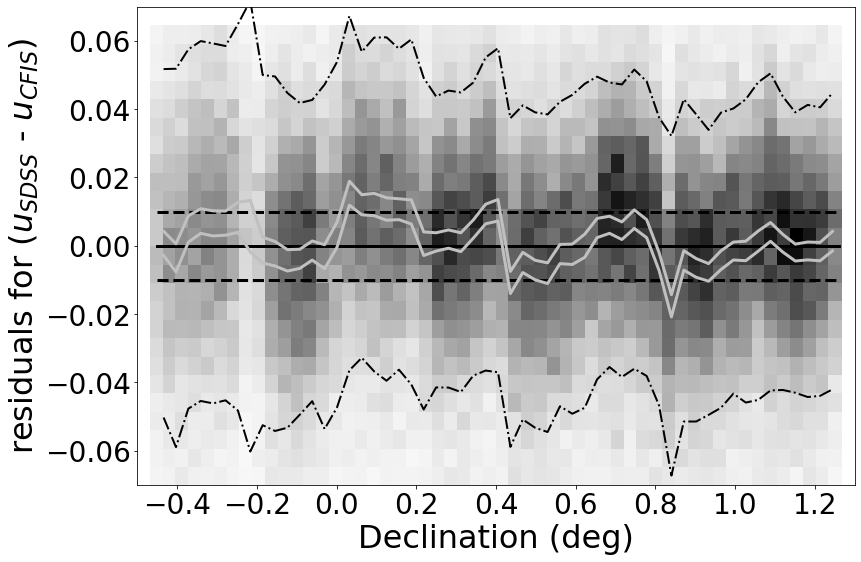

made plot colorResidCFISug_dupsf_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0010399999999995344 std.dev.All: 0.04488978000000048
N= 178050 min= -0.29999999999999716 max= 0.2999000000000037
median: 0.004180000000002224 std.dev: 0.009808887337174594
saved plot as: colorResidCFISug_dupsf_umag.png


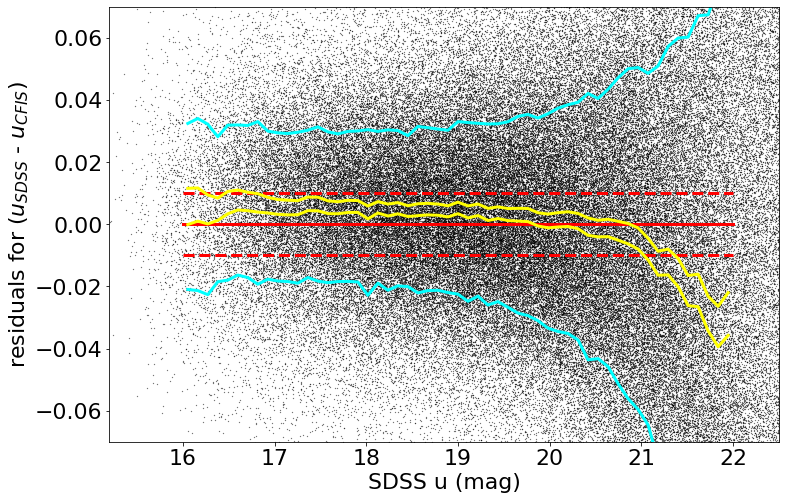

made plot colorResidCFISug_dupsf_umag.png
------------------------------------------------------------------
=========== WORKING ON: duauto ===================
 stats for RA binning medians:
medianAll: 0.0010639999999962277 std.dev.All: 0.0506510550000009
N= 175760 min= -0.2999880000000005 max= 0.2999859999999976
median: -0.002299000000001588 std.dev: 0.014858667569042167
saved plot as: colorResidCFISug_duauto_RA.png


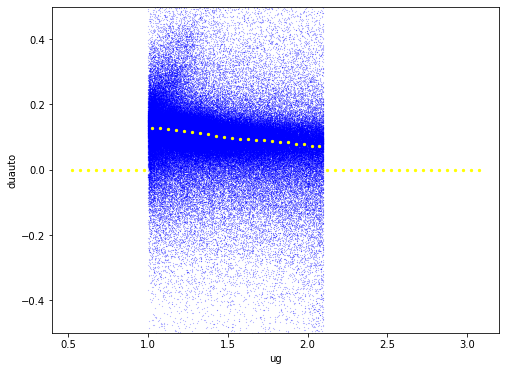

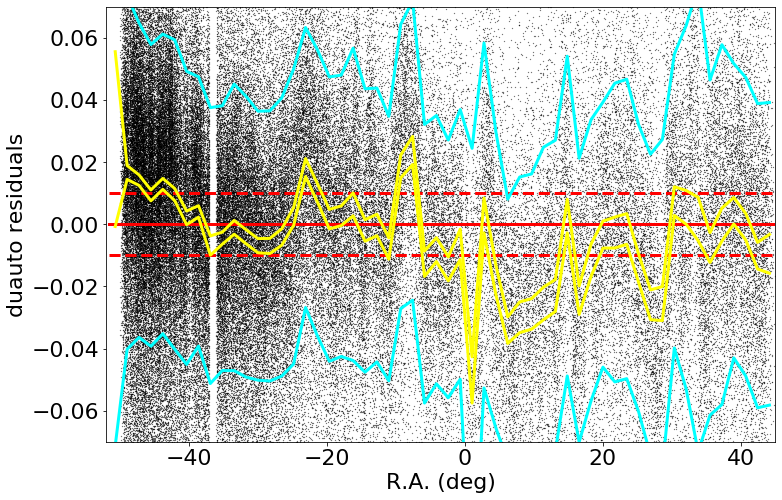

made plot colorResidCFISug_duauto_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0010639999999962277 std.dev.All: 0.0506510550000009
N= 175760 min= -0.2999880000000005 max= 0.2999859999999976
median: 0.0011354999999999837 std.dev: 0.0057791175544227935
saved plot as: colorResidCFISug_duauto_Dec.png


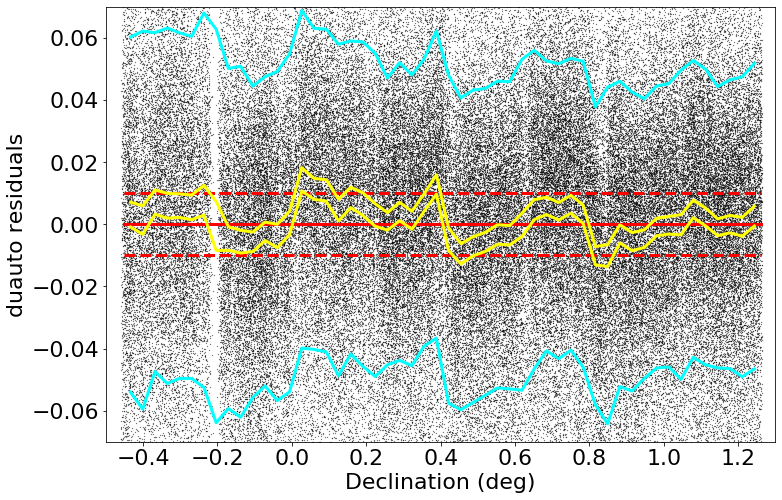

medianAll: 0.0009000000000034813 std.dev.All: 0.054026309999999036
N= 183457 min= -3.3399440000000036 max= 3.9642960000000014
median: 0.001494000000001966 std.dev: 0.00610285097985447
saved plot as: colorResidCFISug_Dec_Hess.png


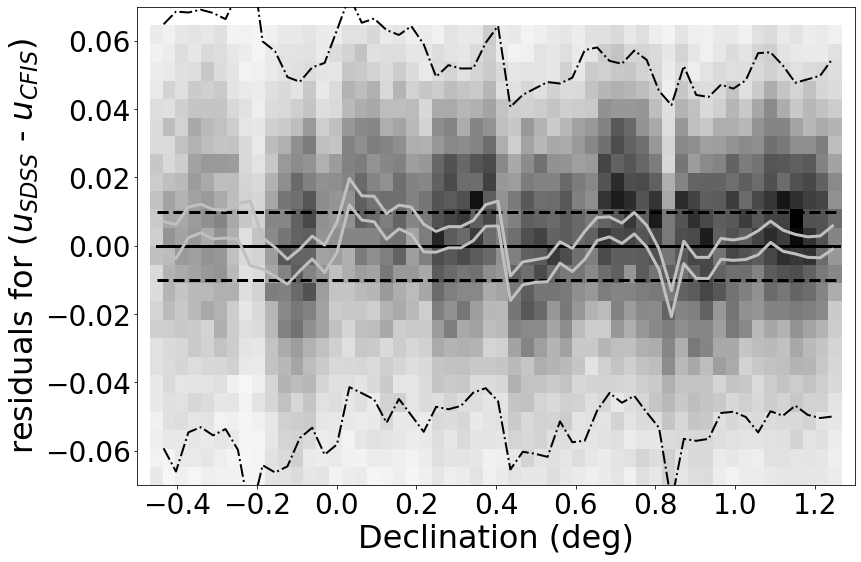

made plot colorResidCFISug_duauto_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0010639999999962277 std.dev.All: 0.0506510550000009
N= 175760 min= -0.2999880000000005 max= 0.2999859999999976
median: 0.005687999999997584 std.dev: 0.01731958963738556
saved plot as: colorResidCFISug_duauto_umag.png


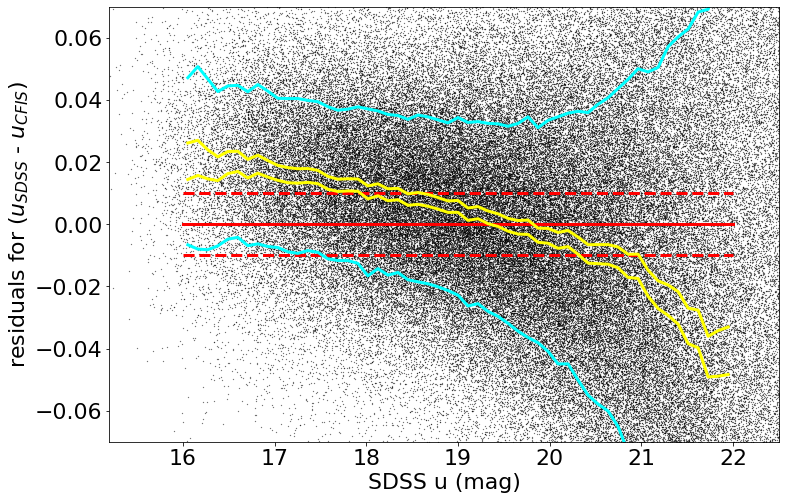

made plot colorResidCFISug_duauto_umag.png
------------------------------------------------------------------
=========== WORKING ON: dra ===================
 stats for RA binning medians:
medianAll: 0.0008280000595561211 std.dev.All: 0.07757914306298978
N= 179937 min= -0.299952000036683 max= 0.2998079999620984
median: -0.01588680004758912 std.dev: 0.023785748430265284
saved plot as: colorResidCFISug_dra_RA.png


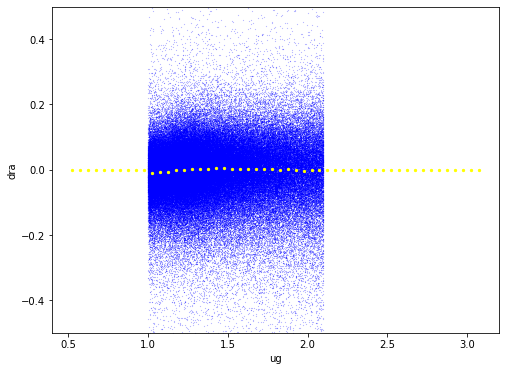

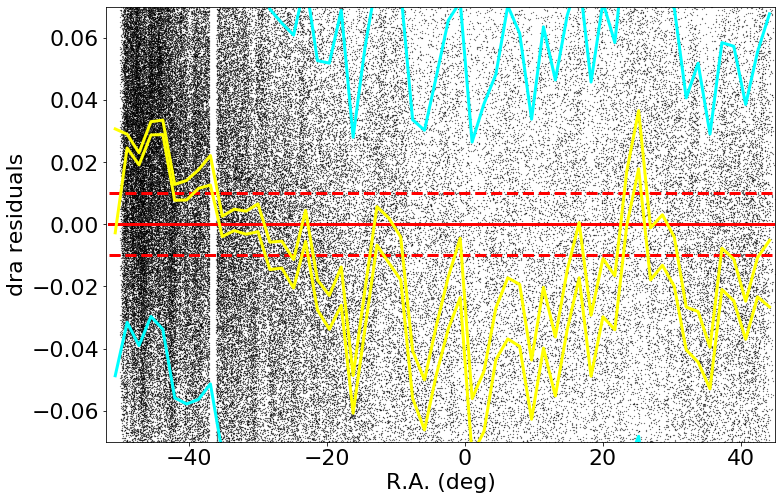

made plot colorResidCFISug_dra_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0008280000595561211 std.dev.All: 0.07757914306298978
N= 179937 min= -0.299952000036683 max= 0.2998079999620984
median: 0.000543599995609194 std.dev: 0.004694726826086304
saved plot as: colorResidCFISug_dra_Dec.png


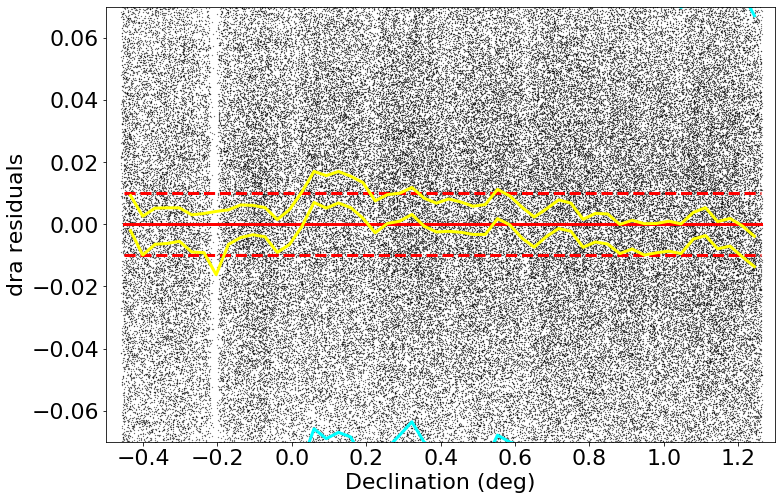

medianAll: -7.919997278803097e-05 std.dev.All: 0.07968121188677282
N= 183457 min= -0.9746927999440231 max= 0.9843839999841181
median: -0.001195200013455626 std.dev: 0.0047805147545765285
saved plot as: colorResidCFISug_Dec_Hess.png


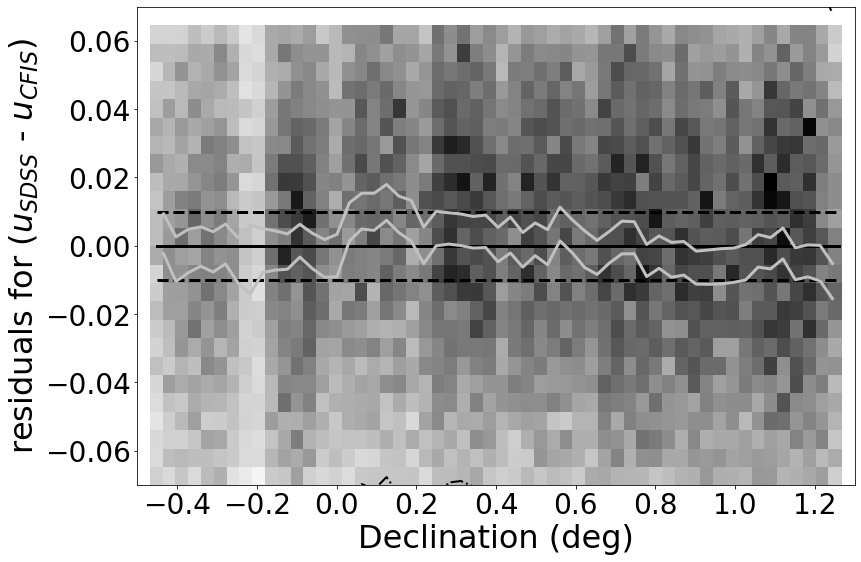

made plot colorResidCFISug_dra_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0008280000595561211 std.dev.All: 0.07757914306298978
N= 179937 min= -0.299952000036683 max= 0.2998079999620984
median: 0.0015120000509232885 std.dev: 0.009633752028478203
saved plot as: colorResidCFISug_dra_umag.png


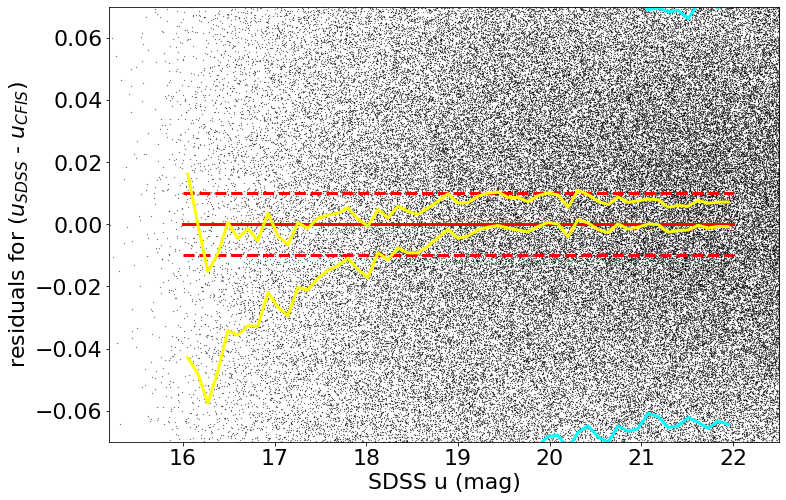

made plot colorResidCFISug_dra_umag.png
------------------------------------------------------------------
=========== WORKING ON: ddec ===================
 stats for RA binning medians:
medianAll: -0.00010080000005883993 std.dev.All: 0.06761298960023286
N= 181121 min= -0.2999088000000079 max= 0.2998800000000301
median: -0.0023039999997502385 std.dev: 0.01602432675026323
saved plot as: colorResidCFISug_ddec_RA.png


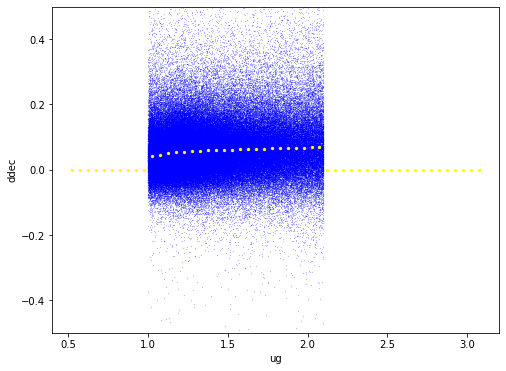

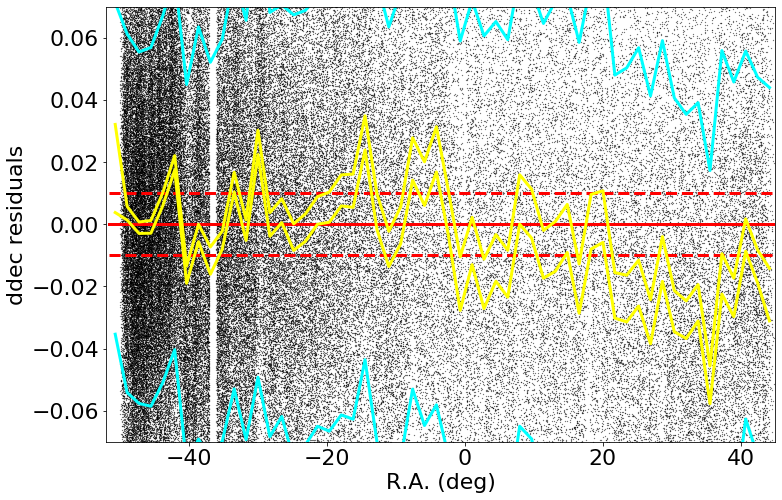

made plot colorResidCFISug_ddec_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.00010080000005883993 std.dev.All: 0.06761298960023286
N= 181121 min= -0.2999088000000079 max= 0.2998800000000301
median: 0.0010223999999374733 std.dev: 0.007596797718489767
saved plot as: colorResidCFISug_ddec_Dec.png


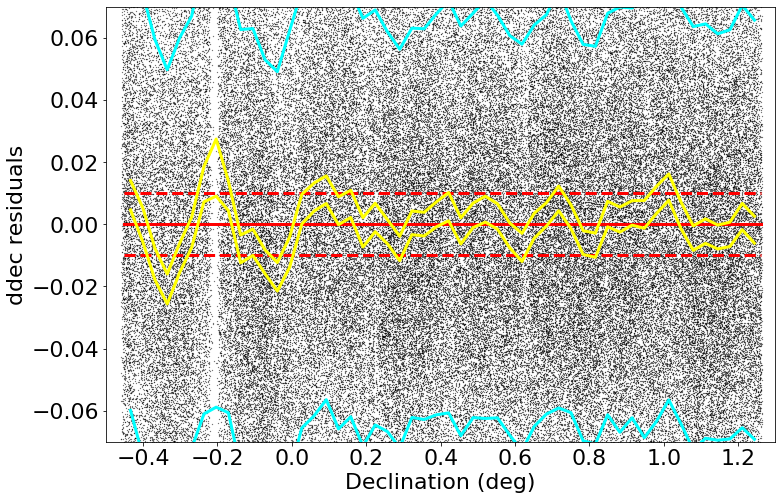

medianAll: 0.0007055999999523374 std.dev.All: 0.06885609120015862
N= 183457 min= -1.0205567999999943 max= 0.9321264000000238
median: 0.001342799999900765 std.dev: 0.007724827637092317
saved plot as: colorResidCFISug_Dec_Hess.png


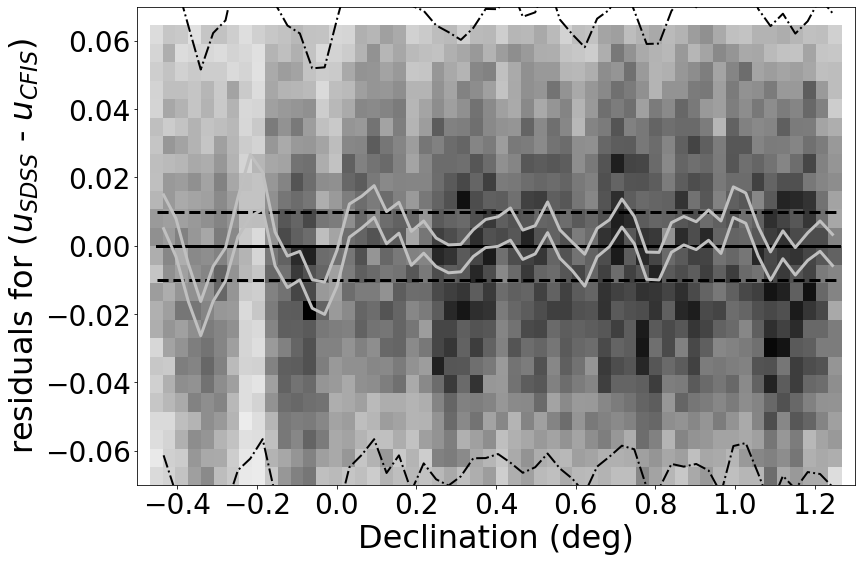

made plot colorResidCFISug_ddec_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: -0.00010080000005883993 std.dev.All: 0.06761298960023286
N= 181121 min= -0.2999088000000079 max= 0.2998800000000301
median: 0.003477600000155935 std.dev: 0.003985027080060155
saved plot as: colorResidCFISug_ddec_umag.png


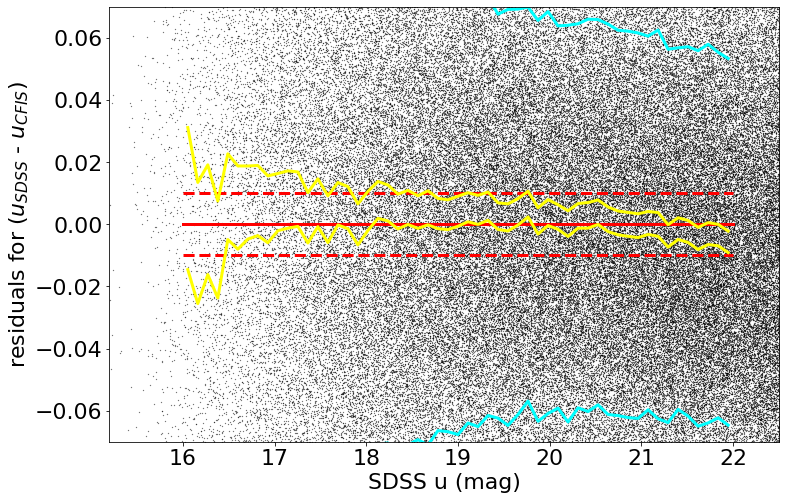

made plot colorResidCFISug_ddec_umag.png
------------------------------------------------------------------


In [15]:
keywords = {"Xstr":'ug', "plotNameRoot":'colorResidCFISug_', "symbSize":0.05}
for color in ('dupsf', 'duauto', 'dra', 'ddec'):
    keywords["Ystr"] = color 
    doOneColor(sdssCFISug, keywords)

=========== WORKING ON: dupsf ===================
 stats for RA binning medians:
medianAll: 0.0010399999999995344 std.dev.All: 0.04488978000000048
N= 178050 min= -0.29999999999999716 max= 0.2999000000000037
median: -0.0037749999999995877 std.dev: 0.015949762641378762
saved plot as: colorResidCFISug_dupsf_RA.png


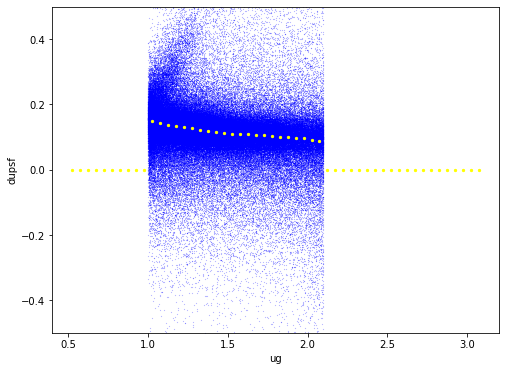

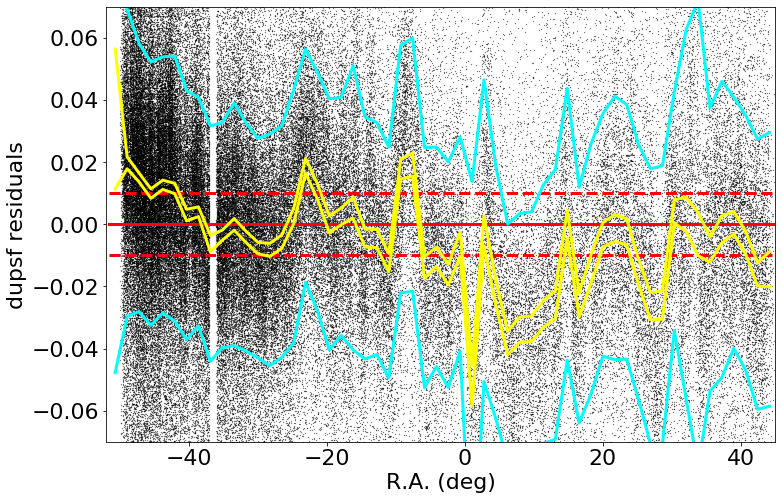

made plot colorResidCFISug_dupsf_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0010399999999995344 std.dev.All: 0.04488978000000048
N= 178050 min= -0.29999999999999716 max= 0.2999000000000037
median: 0.00019999999999836468 std.dev: 0.006113295351716961
saved plot as: colorResidCFISug_dupsf_Dec.png


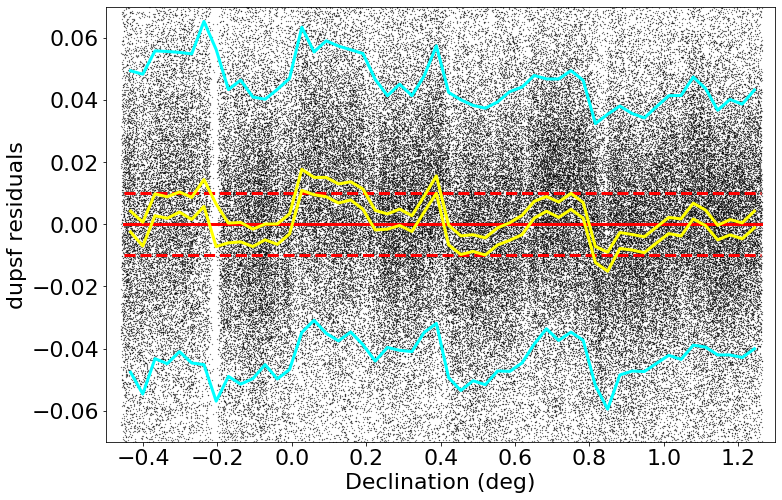

medianAll: 0.001000000000004997 std.dev.All: 0.046890479999998985
N= 183457 min= -4.183720000000003 max= 2.2729299999999997
median: 0.0007200000000034401 std.dev: 0.006427292261768051
saved plot as: colorResidCFISug_Dec_Hess.png


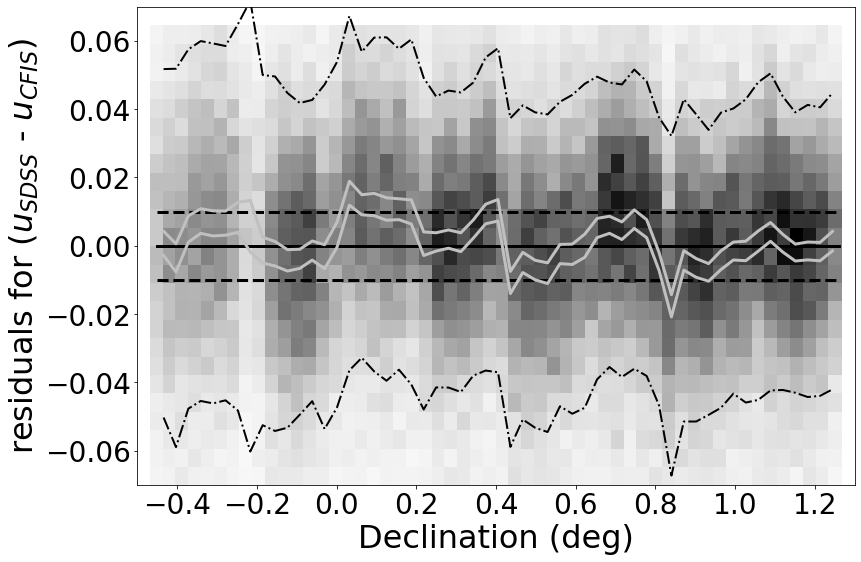

made plot colorResidCFISug_dupsf_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0010399999999995344 std.dev.All: 0.04488978000000048
N= 178050 min= -0.29999999999999716 max= 0.2999000000000037
median: 0.004180000000002224 std.dev: 0.009808887337174594
saved plot as: colorResidCFISug_dupsf_umag.png


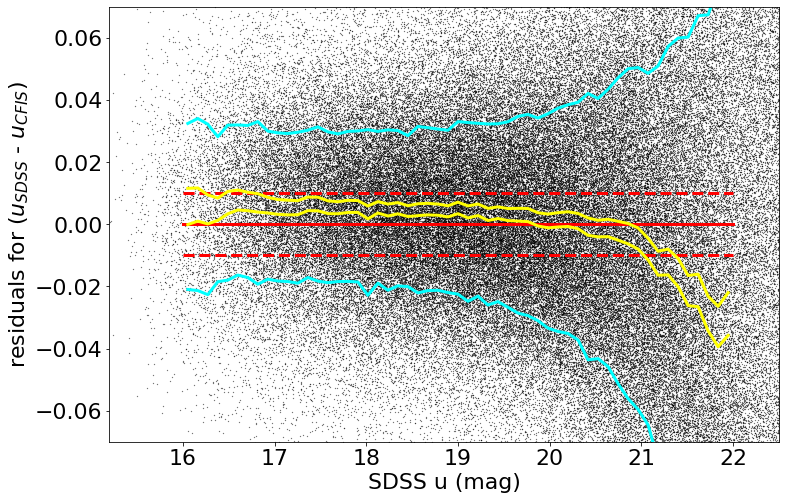

made plot colorResidCFISug_dupsf_umag.png
------------------------------------------------------------------


In [16]:
keywords = {"Xstr":'ug', "plotNameRoot":'colorResidCFISug_', "symbSize":0.05}
color = 'dupsf' 
keywords["Ystr"] = color 
doOneColor(sdssCFISug, keywords)

=========== WORKING ON: dupsf ===================
 stats for RA binning medians:
medianAll: 0.0010999999999988241 std.dev.All: 0.038324520000001534
N= 149136 min= -0.29999999999999716 max= 0.2999799999999983
median: -0.0037449999999995993 std.dev: 0.01593438207496562
saved plot as: colorResidCFISbright_dupsf_RA.png


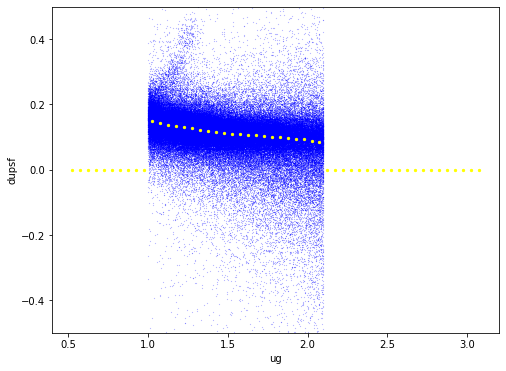

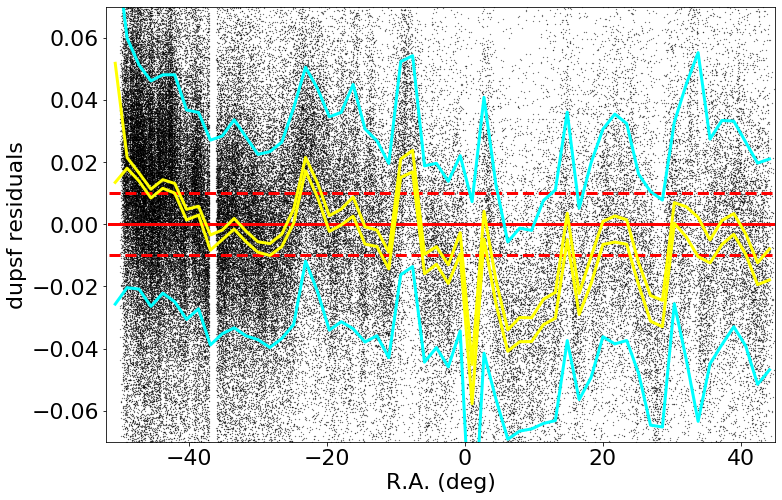

made plot colorResidCFISbright_dupsf_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0010999999999988241 std.dev.All: 0.038324520000001534
N= 149136 min= -0.29999999999999716 max= 0.2999799999999983
median: 0.0006949999999991581 std.dev: 0.005777960789082723
saved plot as: colorResidCFISbright_dupsf_Dec.png


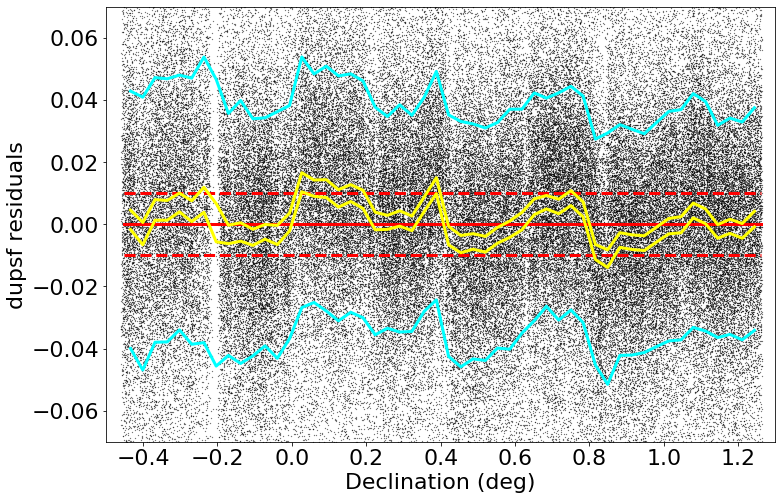

medianAll: 0.001000000000004997 std.dev.All: 0.046890479999998985
N= 183457 min= -4.183720000000003 max= 2.2729299999999997
median: 0.0007200000000034401 std.dev: 0.006427292261768051
saved plot as: colorResidCFISug_Dec_Hess.png


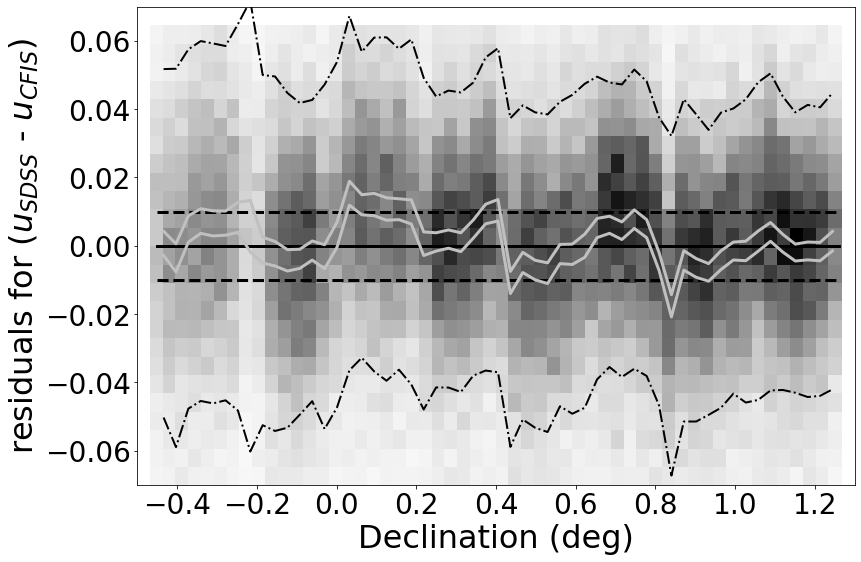

made plot colorResidCFISbright_dupsf_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0010999999999988241 std.dev.All: 0.038324520000001534
N= 149136 min= -0.29999999999999716 max= 0.2999799999999983
median: 0.004899999999998905 std.dev: 0.013885515725935731
saved plot as: colorResidCFISbright_dupsf_umag.png


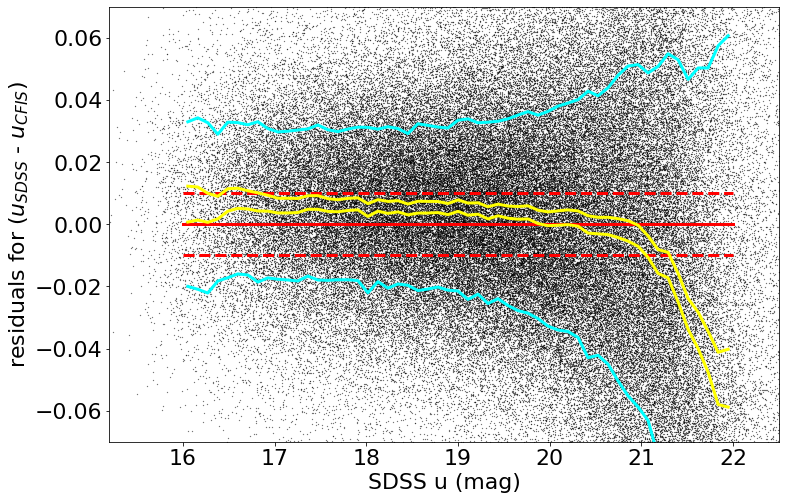

made plot colorResidCFISbright_dupsf_umag.png
------------------------------------------------------------------
=========== WORKING ON: duauto ===================
 stats for RA binning medians:
medianAll: 0.0012090000000005569 std.dev.All: 0.043274955750002994
N= 148192 min= -0.29983599999999705 max= 0.2998719999999991
median: -0.002167750000000683 std.dev: 0.014711136552299133
saved plot as: colorResidCFISbright_duauto_RA.png


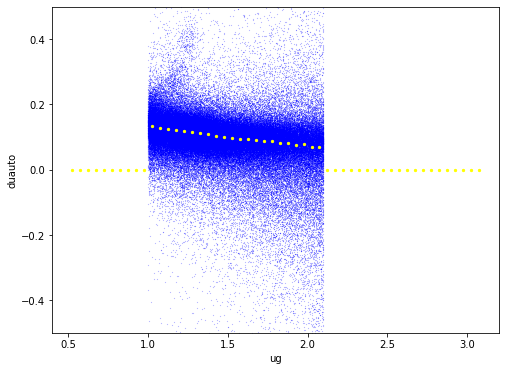

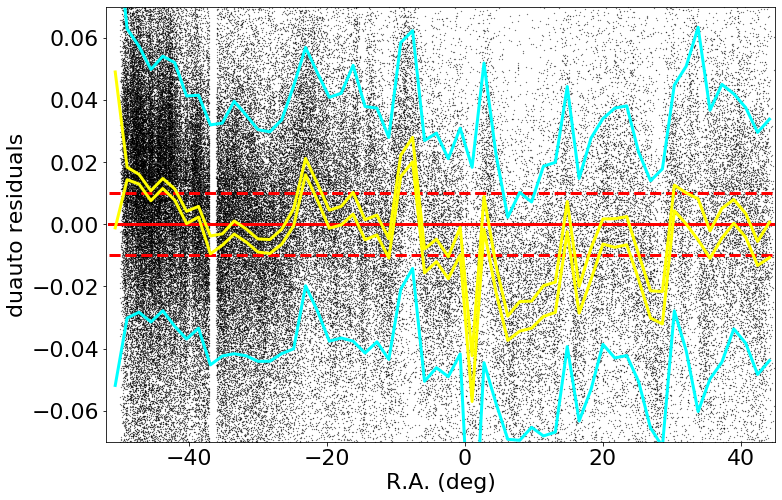

made plot colorResidCFISbright_duauto_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0012090000000005569 std.dev.All: 0.043274955750002994
N= 148192 min= -0.29983599999999705 max= 0.2998719999999991
median: 0.0008700000000000929 std.dev: 0.0054206906750521875
saved plot as: colorResidCFISbright_duauto_Dec.png


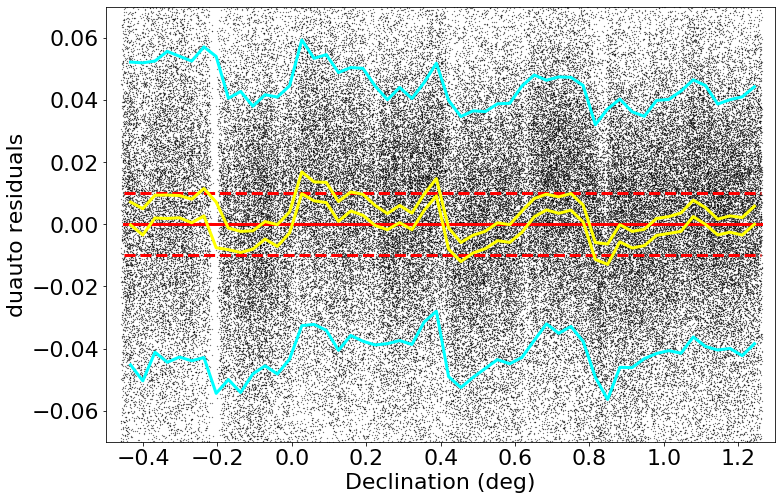

medianAll: 0.001000000000004997 std.dev.All: 0.046890479999998985
N= 183457 min= -4.183720000000003 max= 2.2729299999999997
median: 0.0007200000000034401 std.dev: 0.006427292261768051
saved plot as: colorResidCFISug_Dec_Hess.png


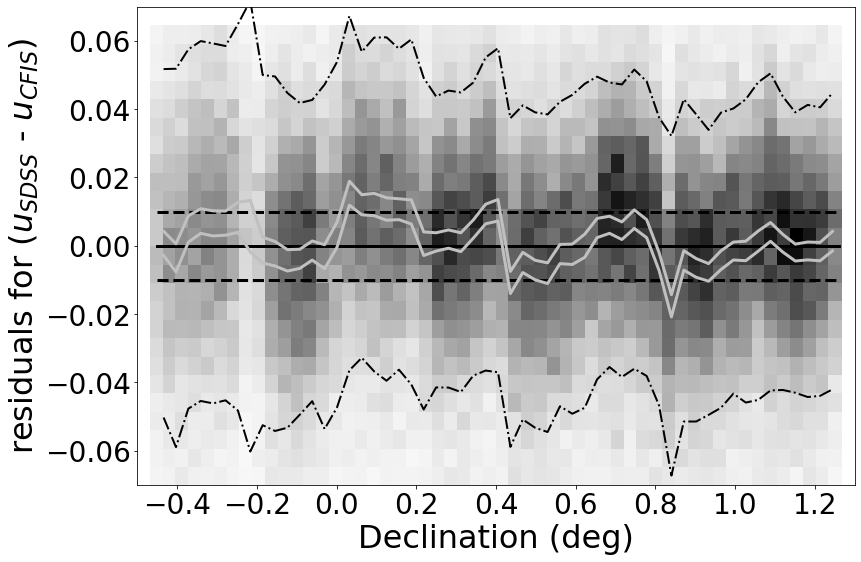

made plot colorResidCFISbright_duauto_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0012090000000005569 std.dev.All: 0.043274955750002994
N= 148192 min= -0.29983599999999705 max= 0.2998719999999991
median: 0.005906000000001743 std.dev: 0.020580036405219368
saved plot as: colorResidCFISbright_duauto_umag.png


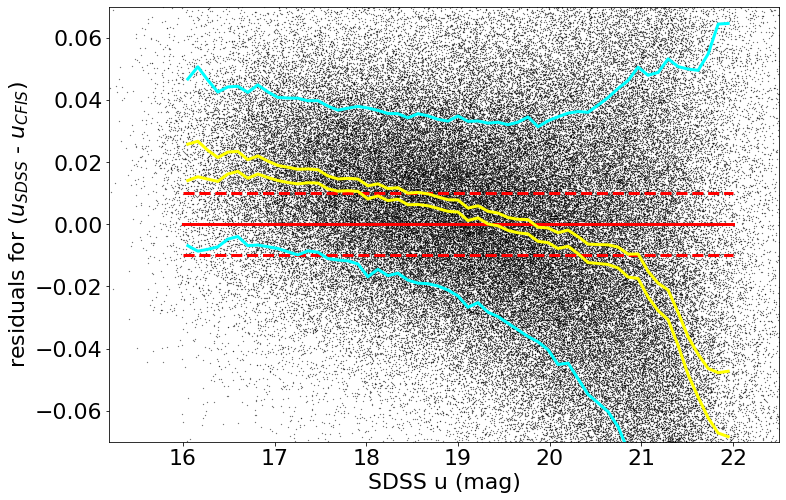

made plot colorResidCFISbright_duauto_umag.png
------------------------------------------------------------------
=========== WORKING ON: dra ===================
 stats for RA binning medians:
medianAll: 0.0010835999917517838 std.dev.All: 0.08132712122568073
N= 147904 min= -0.2999808000170673 max= 0.29987999993659287
median: -0.020673000003057534 std.dev: 0.025559310922362032
saved plot as: colorResidCFISbright_dra_RA.png


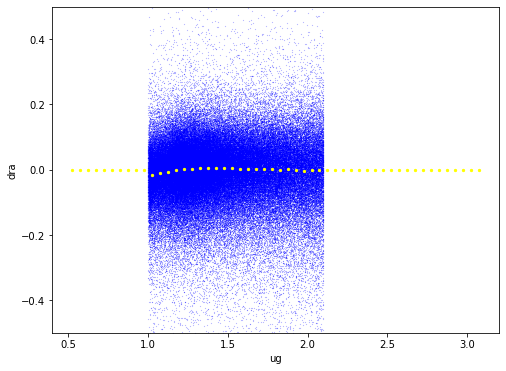

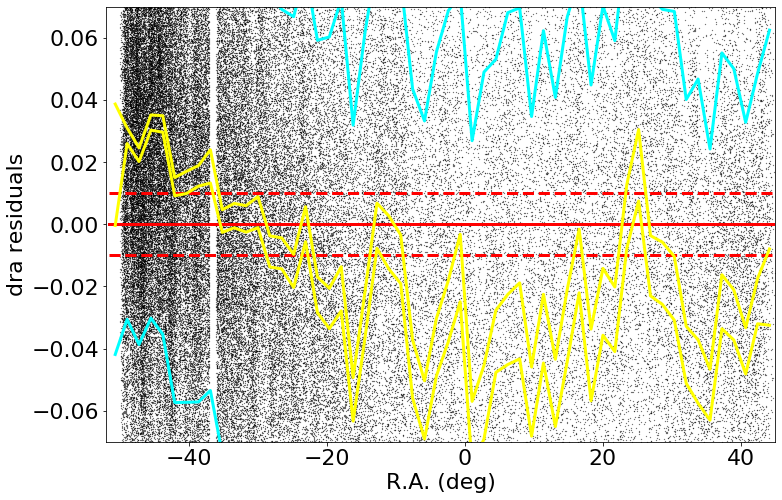

made plot colorResidCFISbright_dra_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0010835999917517838 std.dev.All: 0.08132712122568073
N= 147904 min= -0.2999808000170673 max= 0.29987999993659287
median: 0.000774000036399195 std.dev: 0.005076744551877658
saved plot as: colorResidCFISbright_dra_Dec.png


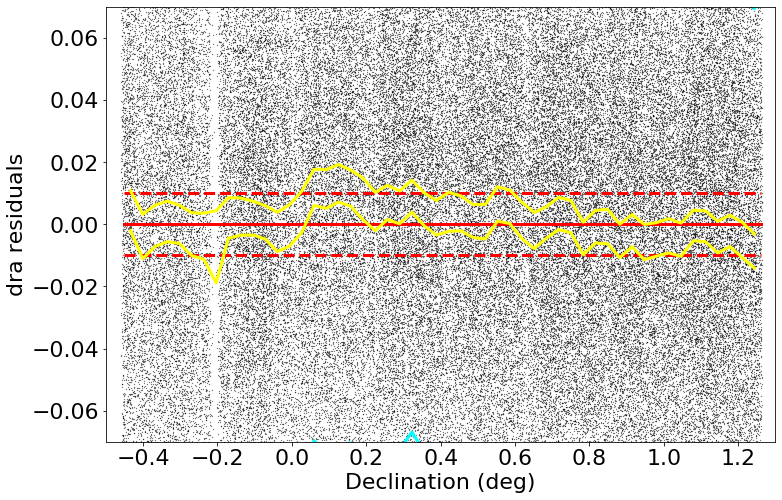

medianAll: 0.001000000000004997 std.dev.All: 0.046890479999998985
N= 183457 min= -4.183720000000003 max= 2.2729299999999997
median: 0.0007200000000034401 std.dev: 0.006427292261768051
saved plot as: colorResidCFISug_Dec_Hess.png


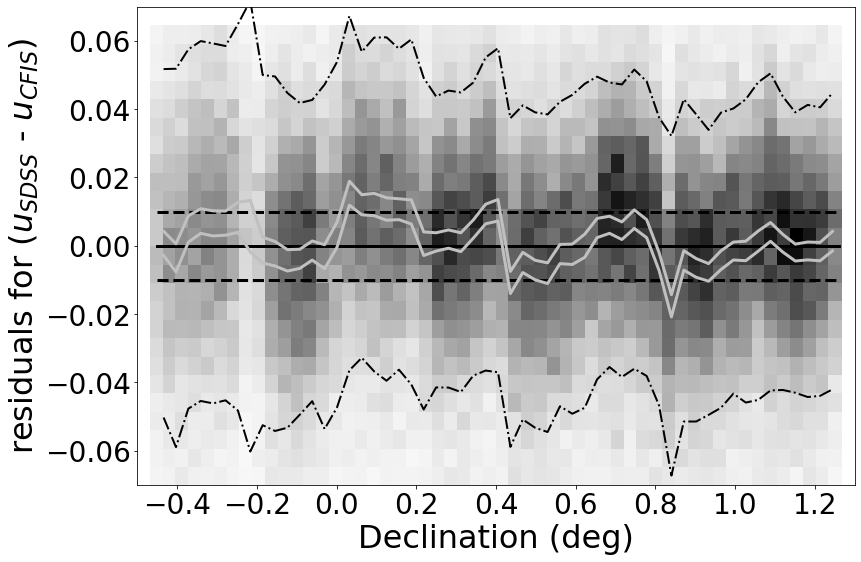

made plot colorResidCFISbright_dra_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: 0.0010835999917517838 std.dev.All: 0.08132712122568073
N= 147904 min= -0.2999808000170673 max= 0.29987999993659287
median: 0.0008135999148635414 std.dev: 0.009858113459624139
saved plot as: colorResidCFISbright_dra_umag.png


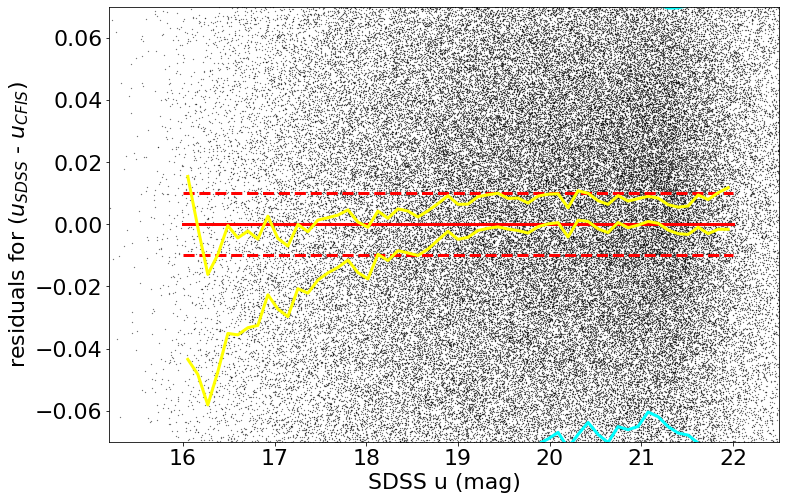

made plot colorResidCFISbright_dra_umag.png
------------------------------------------------------------------
=========== WORKING ON: ddec ===================
 stats for RA binning medians:
medianAll: -0.0003239999998333673 std.dev.All: 0.06977374560008338
N= 149045 min= -0.2998224000001063 max= 0.2998511999999613
median: -0.002491199999559629 std.dev: 0.01646688909149028
saved plot as: colorResidCFISbright_ddec_RA.png


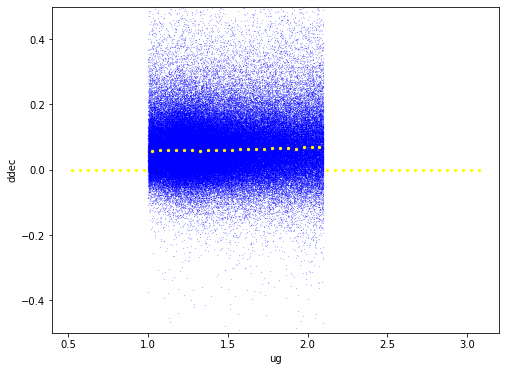

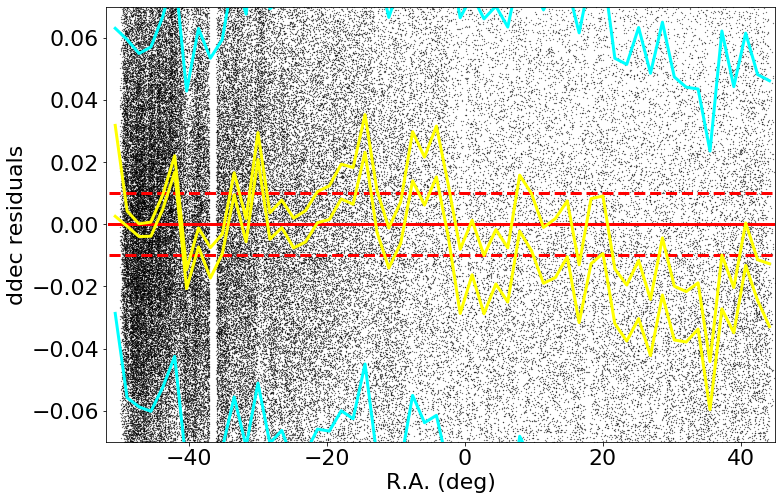

made plot colorResidCFISbright_ddec_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.0003239999998333673 std.dev.All: 0.06977374560008338
N= 149045 min= -0.2998224000001063 max= 0.2998511999999613
median: 0.0006155999999147878 std.dev: 0.007960642537298767
saved plot as: colorResidCFISbright_ddec_Dec.png


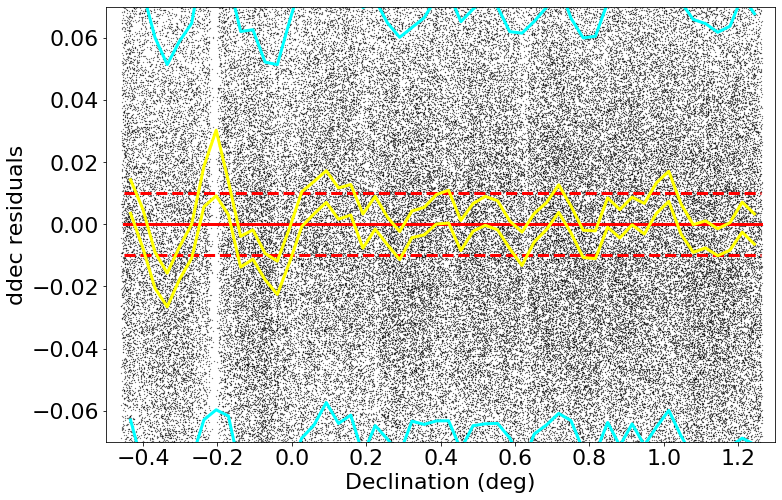

medianAll: 0.001000000000004997 std.dev.All: 0.046890479999998985
N= 183457 min= -4.183720000000003 max= 2.2729299999999997
median: 0.0007200000000034401 std.dev: 0.006427292261768051
saved plot as: colorResidCFISug_Dec_Hess.png


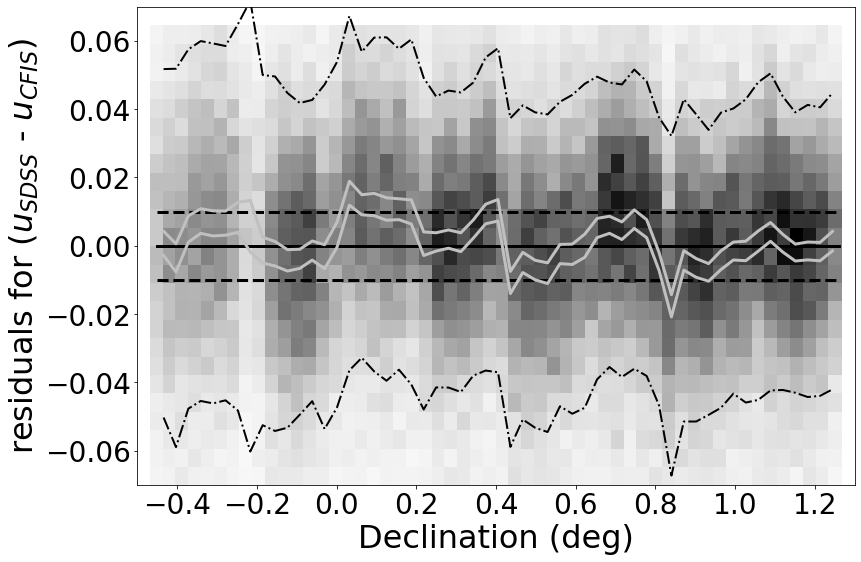

made plot colorResidCFISbright_ddec_Dec.png
-----------
 stats for SDSS u binning medians:
medianAll: -0.0003239999998333673 std.dev.All: 0.06977374560008338
N= 149045 min= -0.2998224000001063 max= 0.2998511999999613
median: 0.00041760000005509196 std.dev: 0.003852954092329567
saved plot as: colorResidCFISbright_ddec_umag.png


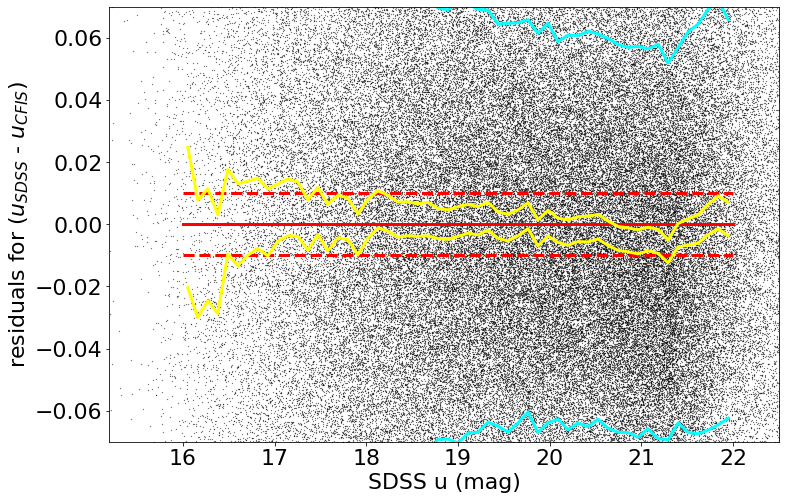

made plot colorResidCFISbright_ddec_umag.png
------------------------------------------------------------------


In [17]:
keywords = {"Xstr":'ug', "plotNameRoot":'colorResidCFISbright_', "symbSize":0.05}
for color in ('dupsf', 'duauto', 'dra', 'ddec'):
    keywords["Ystr"] = color 
    doOneColor(sdssCFISbright, keywords)

medianAll: -0.013999999999999346 std.dev.All: 0.017913674999998398
N= 151238 min= -1.9678000000000004 max= 3.6235
median: -0.01120000000000232 std.dev: 0.010459201097756186
saved plot as: colorResidCFISbright_CFISupsfVSuauto.png


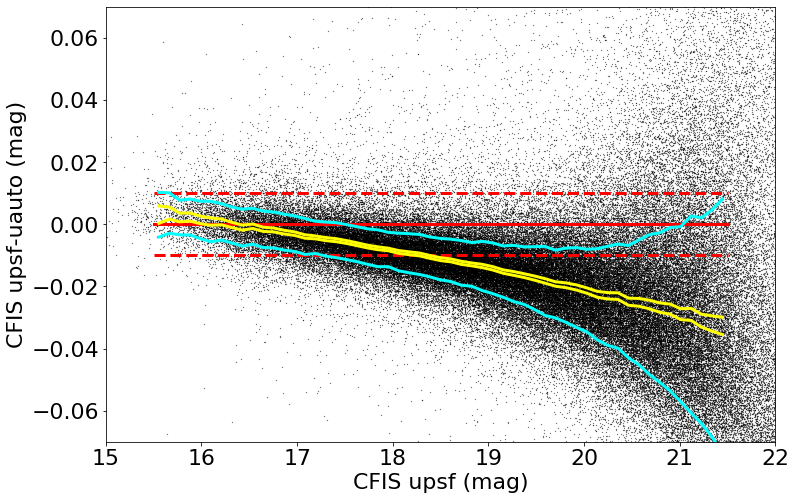

In [18]:
plotName = 'colorResidCFISbright_CFISupsfVSuauto.png' 
Ylabel = 'CFIS upsf-uauto (mag)'
kwOC = {"Xstr":'upsf', "Xmin":15, "Xmax":22, "Xlabel":'CFIS upsf (mag)', \
          "Ystr":'duCFIS', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":15.5, "XmaxBin":21.5, "nBin":55, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":0.05}
zit.plotdelMag(sdssCFISbright, kwOC)

=========== WORKING ON: dupsf ===================
 stats for RA binning medians:
medianAll: 0.0010999999999988241 std.dev.All: 0.038324520000001534
N= 149136 min= -0.29999999999999716 max= 0.2999799999999983
median: -0.00441999999999898 std.dev: 0.015064330132698586


ERROR: OSError: ZPcorrectionsRA_Gaia_uband_v3.2.dat not found. [numpy.lib._datasource]


OSError: ZPcorrectionsRA_Gaia_uband_v3.2.dat not found.

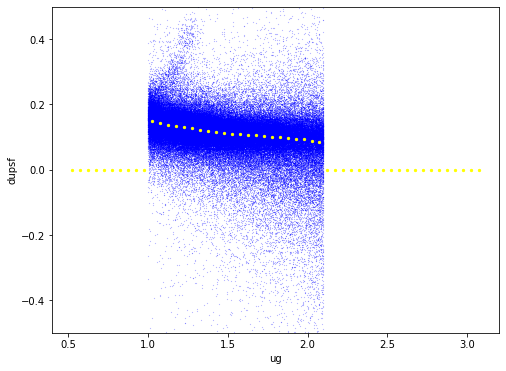

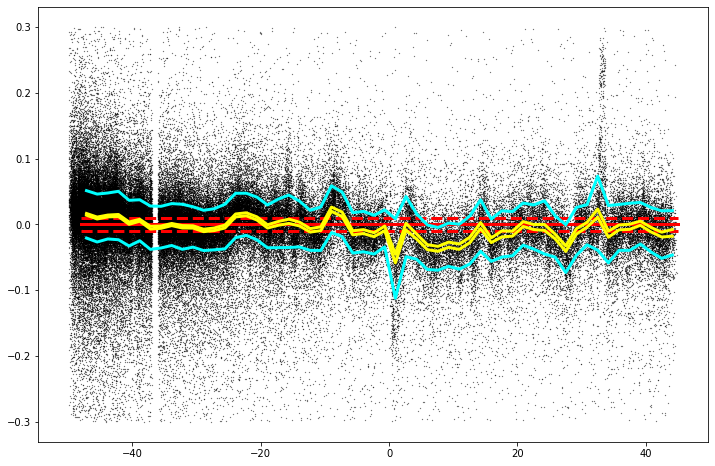

In [19]:
keywords = {"Xstr":'ug', "plotNameRoot":'colorResidCFIS_Gaia_', "symbSize":0.05}
keywords["Ystr"] = 'dupsf' 
doOneColorRA(sdssCFISbright, keywords)

In [ ]:
keywords = {"Xstr":'ug', "plotNameRoot":'colorResidCFIS_Gaia_', "symbSize":0.05}
keywords["Ystr"] = 'dupsf' 
doOneColorDec(sdssCFISbright, keywords)

In [ ]:
sdssCFIS

In [ ]:
fig,ax = plt.subplots(1,1,figsize=(8,6))
ax.scatter(sdssCFIS['u_mMed'], sdssCFIS['u_rms_scatt'], s=0.01, c='blue')
ax.set_xlim(12,22)
ax.set_ylim(0.0,0.2)